# Travel Planner Based on Currency Conversion Risk

**Project Goal:** Create a travel planning tool that will allow the user to select a set of countries they would like to travel to and a travel timeframe (3,6,12 months). The tool will analyze historical Forex data and predict the country that will have the most favorable currency within the given travel timeframe.

**The tool will:** Check Forex volatility as barometer for travel decisions Use historical forex data (up to 2 years) 3 - 6 - 12 months predictive outlook using Monte Carlo and other algorithms Produce graphs, risk graphs, value graphs, Variables - currency / country, traveling times (3-6-12 months)


### Import Library

In [1]:
import os
import requests
import pandas as pd
import pandas_datareader as pdr

from pandas_datareader import data as wb
import seaborn as sns

from dotenv import load_dotenv
import numpy as np
%matplotlib inline
import json
from forex_python.converter import CurrencyRates
import datetime as dt
from countryinfo import CountryInfo

from yahoofinancials import YahooFinancials

import plotly.express as px
from pathlib import Path
#Interactive Plot 
import plotly.offline as pyo
#Candlestick Chart
import plotly.graph_objects as go
from plotly.subplots import make_subplots

pyo.init_notebook_mode(connected=True)
pd.options.plotting.backend = 'plotly'

from MCForecastTools import MCSimulation

In [2]:
# Load .env enviroment variables
load_dotenv()

# Set up API credentials

# Set Alpha Vantage API key 
alpha_vantage_api_key = os.getenv("ALPHA_VANTAGE_API")

# Verify that Alpha Vantage key was correctly loaded
print(f"Alpha Vantage Key type: {type(alpha_vantage_api_key)}")


# Set the Mapbox API key
map_box_api = os.getenv("mapbox")
px.set_mapbox_access_token(map_box_api)
# Verify that Mapbox API key was correctly loaded
print(f"Mapbox Key type: {type(map_box_api)}")

Alpha Vantage Key type: <class 'str'>
Mapbox Key type: <class 'str'>


In [3]:
# put all inputs required for the project up here to be called at once.

print("Lets Start our Travel Planning!" "\n"
     " Please input 3 countries you are interested in traveling to," "\n"
      " followed by your budgeted amount and projected time of travel." "\n" )
print()
name = (input("What Country are you interested in traveling to? "))
name_2 = (input("What Country are you interested in traveling to? "))
name_3 = (input("What Country are you interested in traveling to? "))
amount = int(input("Enter the Amount: "))
number_of_months = int(input("In how many months will you be traveling?"))



Lets Start our Travel Planning!
 Please input 3 countries you are interested in traveling to,
 followed by your budgeted amount and projected time of travel.




What Country are you interested in traveling to?  Italy
What Country are you interested in traveling to?  United Kingdom
What Country are you interested in traveling to?  Canada
Enter the Amount:  1000
In how many months will you be traveling? 12


### Country 1

In [4]:
# Get user input for first country and return basic country data

name = name
#name = (input("What Country are you interested in traveling to? "))
country_name = CountryInfo(name).name()
country_border= CountryInfo(name).borders()
country_capital= CountryInfo(name).capital()
country_currency = CountryInfo(name).currencies()
country_timezone = CountryInfo(name).timezones()
country_wiki = CountryInfo(name).wiki()
country_info = print(f"Country name: {country_name}", '\n'
                      f"Country Capital: {country_capital}", '\n'
                      f"Country Border: {country_border}", '\n' 
                      f"Country Currency: {country_currency}", '\n' 
                      f"Country Timezone: {country_timezone}", '\n'
                      f"Country Wiki: {country_wiki}")

country_info




Country name: italy 
Country Capital: Rome 
Country Border: ['AUT', 'FRA', 'SMR', 'SVN', 'CHE', 'VAT'] 
Country Currency: ['EUR'] 
Country Timezone: ['UTC+01:00'] 
Country Wiki: http://en.wikipedia.org/wiki/italy


### Country 2

In [5]:
# Get user input for the second country and return basic country data

name_2 = name_2
# name_2 = (input("What Country are you interested in traveling to? "))
country_name_2 = CountryInfo(name_2).name()
country_border_2= CountryInfo(name_2).borders()
country_capital_2= CountryInfo(name_2).capital()
country_currency_2 = CountryInfo(name_2).currencies()
country_timezone_2 = CountryInfo(name_2).timezones()
country_wiki_2 = CountryInfo(name_2).wiki()
country_info_2 = print(f"Country name: {country_name_2}", '\n'
                      f"Country Capital: {country_capital_2}", '\n'
                      f"Country Border: {country_border_2}", '\n' 
                      f"Country Currency: {country_currency_2}", '\n' 
                      f"Country Timezone: {country_timezone_2}", '\n'
                      f"Country Wiki: {country_wiki_2}")

country_info_2

Country name: united kingdom 
Country Capital: London 
Country Border: ['IRL'] 
Country Currency: ['GBP'] 
Country Timezone: ['UTC−08:00', 'UTC−05:00', 'UTC−04:00', 'UTC−03:00', 'UTC−02:00', 'UTC', 'UTC+01:00', 'UTC+02:00', 'UTC+06:00'] 
Country Wiki: http://en.wikipedia.org/wiki/united_kingdom


### Country 3

In [6]:
# Get user input for the third country and return basic country data

name_3 = name_3
# name_3 = (input("What Country are you interested in traveling to? "))
country_name_3 = CountryInfo(name_3).name()
country_border_3= CountryInfo(name_3).borders()
country_capital_3= CountryInfo(name_3).capital()
country_currency_3 = CountryInfo(name_3).currencies()
country_timezone_3 = CountryInfo(name_3).timezones()
country_wiki_3 = CountryInfo(name_3).wiki()
country_info_3 = print(f"Country name: {country_name_3}", '\n'
                      f"Country Capital: {country_capital_3}", '\n'
                      f"Country Border: {country_border_3}", '\n' 
                      f"Country Currency: {country_currency_3}", '\n' 
                      f"Country Timezone: {country_timezone_3}", '\n'
                      f"Country Wiki: {country_wiki_3}")

country_info_3

Country name: canada 
Country Capital: Ottawa 
Country Border: ['USA'] 
Country Currency: ['CAD'] 
Country Timezone: ['UTC−08:00', 'UTC−07:00', 'UTC−06:00', 'UTC−05:00', 'UTC−04:00', 'UTC−03:30'] 
Country Wiki: http://en.wikipedia.org/wiki/canada


In [7]:
#country Currency 1
pair = country_currency[0].strip("''")
forex_pair = pair + "USD"

#Country Currency 2
pair_2 = country_currency_2[0].strip("''")
forex_pair_2 = pair_2 + "USD"

#Country Currency 3
pair_3 = country_currency_3[0].strip("''")
forex_pair_3 = pair_3 + "USD"

print(f' We will now analyze the following pairs: \n {forex_pair} \n {forex_pair_2} \n {forex_pair_3}')

 We will now analyze the following pairs: 
 EURUSD 
 GBPUSD 
 CADUSD


In [8]:
# Currency 1
time_series = pdr.av.time_series.AVTimeSeriesReader(forex_pair, api_key='alpha_vantage_api_key')
forex = time_series.read()
forex.index = pd.to_datetime(forex.index, format='%Y-%m-%d')
Forex = forex

# Currency 2
time_series_2 = pdr.av.time_series.AVTimeSeriesReader(forex_pair_2, api_key='alpha_vantage_api_key')
forex_2 = time_series_2.read()
forex_2.index = pd.to_datetime(forex_2.index, format='%Y-%m-%d')
Forex_2 = forex_2

# Currency 3
time_series_3 = pdr.av.time_series.AVTimeSeriesReader(forex_pair_3, api_key='alpha_vantage_api_key')
forex_3 = time_series_3.read()
forex_3.index = pd.to_datetime(forex_3.index, format='%Y-%m-%d')
Forex_3 = forex_3

In [9]:
# Currency 1
forex_close = Forex.drop(columns=['volume', 'open', 'high', 'low'])

# Currency 2
forex_2_close = Forex_2.drop(columns=['volume', 'open', 'high', 'low'])

# Currency 3
forex_3_close = Forex_3.drop(columns=['volume', 'open', 'high', 'low'])

# Concat all 3 countries currency
joined_forex = pd.concat([forex_close, forex_2_close, forex_3_close], axis="columns", join="inner", keys=[f'{forex_pair}',f'{forex_pair_2}',f'{forex_pair_3}'])

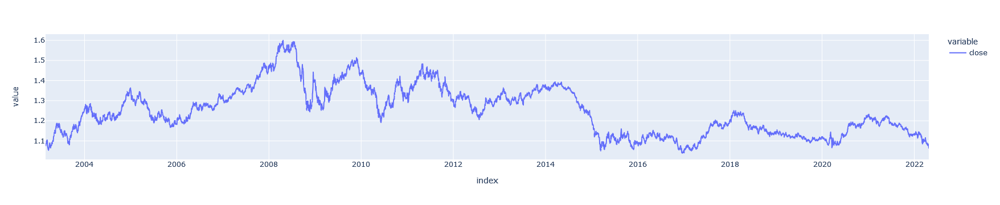

In [14]:
# Plot The Closing Value 
forex[['close']].plot()

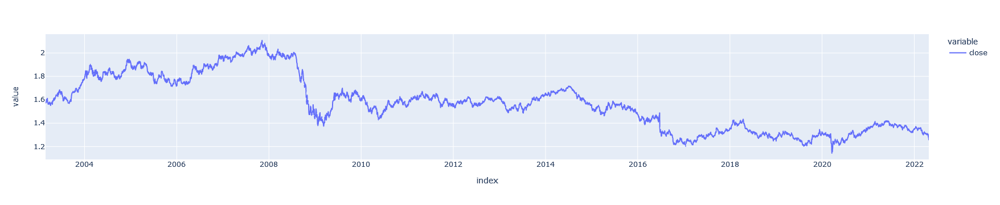

In [15]:
# Plot The Closing Value Of Country Currency 2
forex_2[['close']].plot()

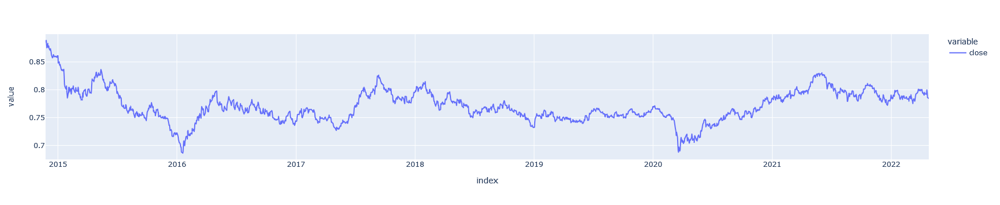

In [16]:
# Plot The Closing Value Of Country Currency 3
forex_3[['close']].plot()

In [17]:
forex_stats = forex.describe()
forex_stats

,open,high,low,close,volume
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.0
mean,1.249035,1.254408,1.243601,1.249019,0.0
std,0.120297,0.121111,0.119452,0.120298,0.0
min,1.039000,1.041800,1.033900,1.039000,0.0
25%,1.140075,1.144475,1.135500,1.139900,0.0
50%,1.233350,1.238800,1.227800,1.233250,0.0
75%,1.335725,1.340625,1.329000,1.335825,0.0
max,1.599600,1.603500,1.586600,1.599600,0.0


In [18]:
forex_stats_2 = forex_2.describe()
forex_stats_2

,open,high,low,close,volume
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.0
mean,1.571560,1.578220,1.564659,1.571509,0.0
std,0.224815,0.225374,0.224263,0.224861,0.0
min,1.143300,1.171400,1.140800,1.143400,0.0
25%,1.365425,1.369800,1.359725,1.365425,0.0
50%,1.567700,1.573500,1.561200,1.567700,0.0
75%,1.729875,1.738000,1.720400,1.729550,0.0
max,2.107300,2.115900,2.097200,2.107200,0.0


In [19]:
forex_stats_3 = forex_3.describe()
forex_stats_3

,open,high,low,close,volume
count,1937.000000,1937.000000,1937.000000,1937.000000,1937.0
mean,0.770453,0.773427,0.767682,0.770617,0.0
std,0.029282,0.029297,0.029127,0.029131,0.0
min,0.685800,0.690100,0.680200,0.686100,0.0
25%,0.751800,0.754300,0.749900,0.752000,0.0
50%,0.765700,0.768300,0.763100,0.766000,0.0
75%,0.789900,0.792900,0.786600,0.789900,0.0
max,0.889300,0.890700,0.884700,0.888700,0.0


# Plot the Candlestick charts

### Plot The First Countries Currency On A Candlestick Chart Verse The US Dollar

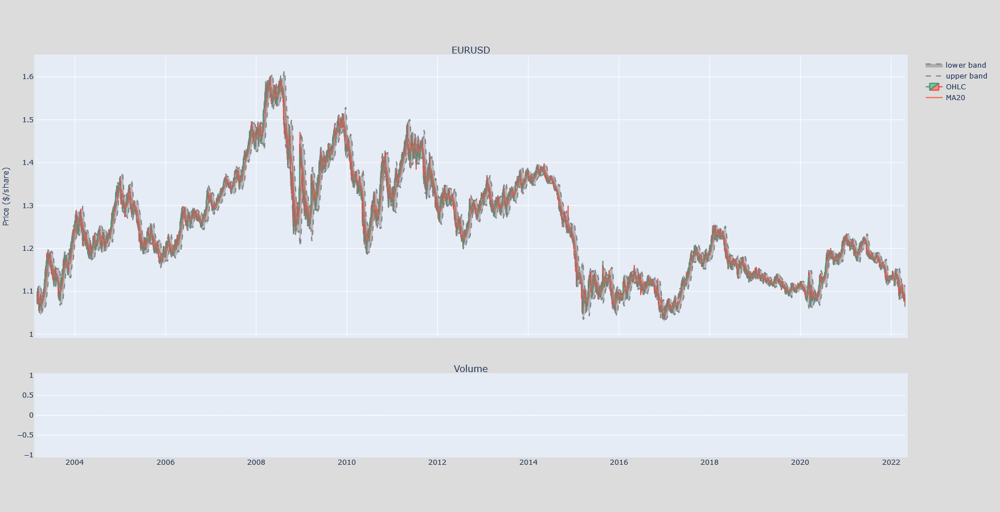

In [20]:
# Set moving Average and STD
forex['MA20'] = forex['close'].rolling(window=20, min_periods=0).mean()
forex['std'] = forex['close'].rolling(window=20, min_periods=0).std(ddof = 0)

# set fig
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
               vertical_spacing=0.10, subplot_titles=(forex_pair, 'Volume'), 
               row_width=[0.2, 0.7])



# Volume
fig.add_trace(go.Bar(x=forex.index, y=forex['volume'], marker_color='lime', showlegend=False), row=2, col=1)

# 20 period moving average
fig.add_trace(go.Scatter(x=forex.index, y=forex["MA20"], marker_color='tomato',name="MA20"), row=1, col=1)



# Candlestick chart
fig.add_trace(go.Candlestick(x=forex.index, open=forex["open"], high=forex["high"],
                low=forex["low"], close=forex["close"], name="OHLC"), 
                row=1, col=1)


# Create a Bollinger Band

# Upper Bound
fig.add_trace(go.Scatter(x=forex.index, 
                         y=forex["MA20"] + (forex['std'] * 2),
                         line_color = 'gray',
                         line = {'dash': 'dash'},
                         name = 'upper band',
                         opacity = 0.5),
              row = 1, col = 1)

# Lower Bound fill in between with parameter 'fill': 'tonexty'
fig.add_trace(go.Scatter(x=forex.index, 
                         y=forex["MA20"] - (forex['std'] * 2),
                         line_color = 'gray',
                         line = {'dash': 'dash'},
                         fill = 'tonexty',
                         name = 'lower band',
                         opacity = 0.01),
              row = 1, col = 1)


fig.update_layout(
#    title= f'{forex_pair} Historical price chart',
    xaxis_tickfont_size=12,
    yaxis=dict(
        title='Price ($/share)',
        titlefont_size=14,
        tickfont_size=12,
    ),
    autosize=True,
    width=900,
    height=900,
    margin=dict(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor='gainsboro'
    
)
# Remove range slider; (short time frame)
fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

### Plot The Second Countries Currency On A Candlestick Chart Verse The US Dollar

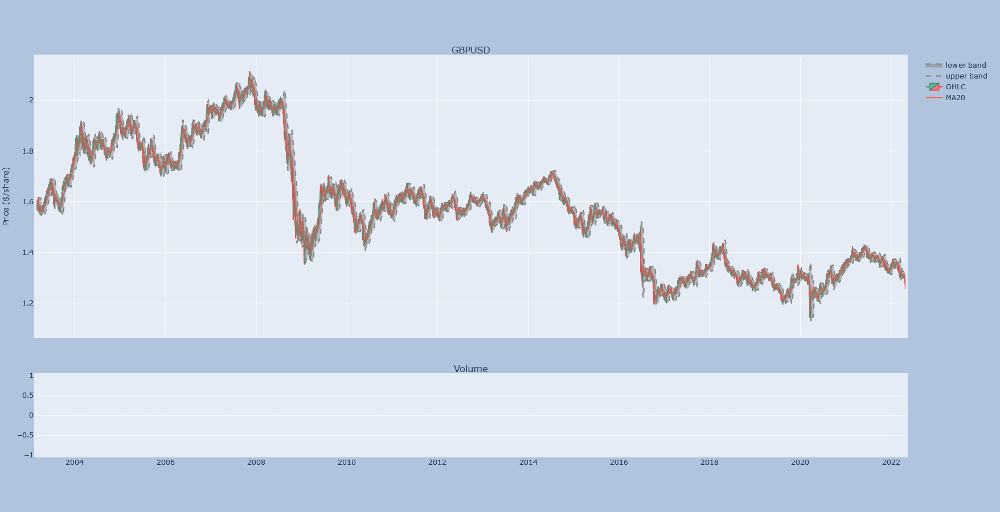

In [21]:
# Country Currency 2

# Set moving Average and STD
forex_2['MA20'] = forex_2['close'].rolling(window=20, min_periods=0).mean()
forex_2['std'] = forex_2['close'].rolling(window=20, min_periods=0).std(ddof = 0)

# set fig
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
               vertical_spacing=0.10, subplot_titles=(forex_pair_2, 'Volume'), 
               row_width=[0.2, 0.7])



# Volume
fig.add_trace(go.Bar(x=forex_2.index, y=forex_2['volume'], marker_color='lime', showlegend=False), row=2, col=1)

# 20 period moving average
fig.add_trace(go.Scatter(x=forex_2.index, y=forex_2["MA20"], marker_color='tomato',name="MA20"), row=1, col=1)



# Candlestick chart
fig.add_trace(go.Candlestick(x=forex_2.index, open=forex_2["open"], high=forex_2["high"],
                low=forex_2["low"], close=forex_2["close"], name="OHLC"), 
                row=1, col=1)


# Create a Bollinger Band

# Upper Bound
fig.add_trace(go.Scatter(x=forex_2.index, 
                         y=forex_2["MA20"] + (forex_2['std'] * 2),
                         line_color = 'gray',
                         line = {'dash': 'dash'},
                         name = 'upper band',
                         opacity = 0.5),
              row = 1, col = 1)

# Lower Bound fill in between with parameter 'fill': 'tonexty'
fig.add_trace(go.Scatter(x=forex_2.index, 
                         y=forex_2["MA20"] - (forex_2['std'] * 2),
                         line_color = 'gray',
                         line = {'dash': 'dash'},
                         fill = 'tonexty',
                         name = 'lower band',
                         opacity = 0.01),
              row = 1, col = 1)


fig.update_layout(
#    title= f'{forex_pair_2} Historical price chart',
    xaxis_tickfont_size=12,
    yaxis=dict(
        title='Price ($/share)',
        titlefont_size=14,
        tickfont_size=12,
    ),
    autosize=True,
    width=900,
    height=900,
    margin=dict(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor='LightSteelBlue'
    
)
# Remove range slider; (short time frame)
fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()



### Plot The Third Countries Currency On A Candlestick Chart Verse The US Dollar

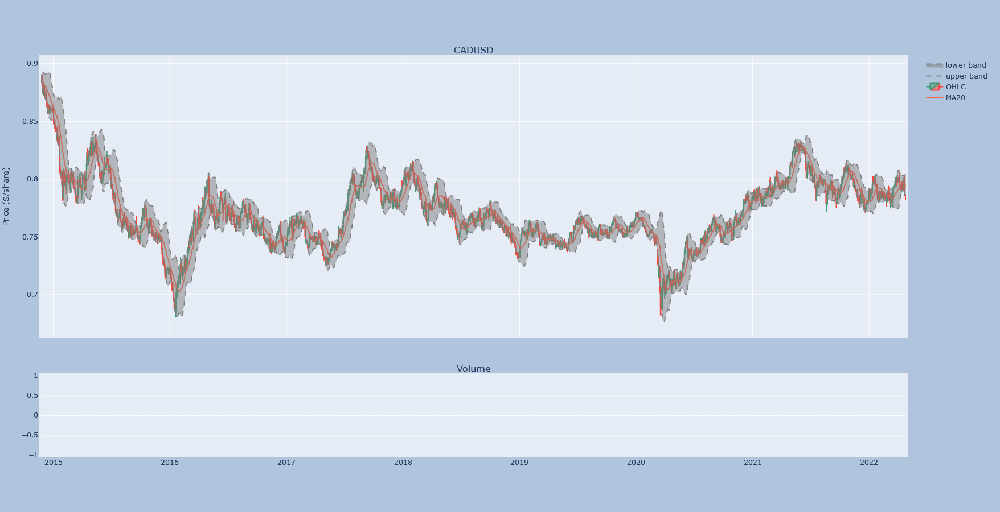

In [22]:
# Country Currency 3

# Set moving Average and STD
forex_3['MA20'] = forex_3['close'].rolling(window=20, min_periods=0).mean()
forex_3['std'] = forex_3['close'].rolling(window=20, min_periods=0).std(ddof = 0)

# set fig
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
               vertical_spacing=0.10, subplot_titles=(forex_pair_3, 'Volume'), 
               row_width=[0.2, 0.7])



# Volume
fig.add_trace(go.Bar(x=forex_3.index, y=forex_3['volume'], marker_color='lime', showlegend=False), row=2, col=1)

# 20 period moving average
fig.add_trace(go.Scatter(x=forex_3.index, y=forex_3["MA20"], marker_color='tomato',name="MA20"), row=1, col=1)



# Candlestick chart
fig.add_trace(go.Candlestick(x=forex_3.index, open=forex_3["open"], high=forex_3["high"],
                low=forex_3["low"], close=forex_3["close"], name="OHLC"), 
                row=1, col=1)


# Create a Bollinger Band

# Upper Bound
fig.add_trace(go.Scatter(x=forex_3.index, 
                         y=forex_3["MA20"] + (forex_3['std'] * 2),
                         line_color = 'gray',
                         line = {'dash': 'dash'},
                         name = 'upper band',
                         opacity = 0.5),
              row = 1, col = 1)

# Lower Bound fill in between with parameter 'fill': 'tonexty'
fig.add_trace(go.Scatter(x=forex_3.index, 
                         y=forex_3["MA20"] - (forex_3['std'] * 2),
                         line_color = 'gray',
                         line = {'dash': 'dash'},
                         fill = 'tonexty',
                         name = 'lower band',
                         opacity = 0.01),
              row = 1, col = 1)


fig.update_layout(
#    title= f'{forex_pair_2} Historical price chart',
    xaxis_tickfont_size=12,
    yaxis=dict(
        title='Price ($/share)',
        titlefont_size=14,
        tickfont_size=12,
    ),
    autosize=True,
    width=900,
    height=900,
    margin=dict(l=50, r=50, b=100, t=100, pad=4),
    paper_bgcolor='LightSteelBlue'
    
)
# Remove range slider; (short time frame)
fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

# Foreign Exchange Currency Converter

In [23]:
# Only input the amount of currency to be converted. 

currency, amount = CurrencyRates(), amount #int(input("Enter the Amount: "))
from_currency, to_currency = "USD", pair.upper()


print(from_currency, "To", to_currency, amount)
result =  currency.convert(from_currency, to_currency, amount)
print("Conversion Amount: ", result)

USD To EUR 1000
Conversion Amount:  936.855911560802


In [24]:
# Country 2 currency conversion

currency, amount = CurrencyRates(), amount
from_currency, to_currency = "USD", pair_2.upper()


print(from_currency, "To", to_currency, amount)
result =  currency.convert(from_currency, to_currency, amount)
print("Conversion Amount: ", result)

USD To GBP 1000
Conversion Amount:  788.2237211916809


In [25]:
# country 3 currency conversion

currency, amount = CurrencyRates(), amount
from_currency, to_currency = "USD", pair_3.upper()


print(from_currency, "To", to_currency, amount)
result =  currency.convert(from_currency, to_currency, amount)
print("Conversion Amount: ", result)

USD To CAD 1000
Conversion Amount:  1275.3419524077199


# Monte Carlo Simulation on the returns of your inputed currency

### Plot the Simulated Outcomes for the inputed amount of days trajectory for the currency of country 1


### Country Currency 1 Monte Carlo 

In [26]:
# time_series = pdr.av.time_series.AVTimeSeriesReader(f'{forex_pair}', api_key='alpha_vantage_api_key')
# forex = time_series.read()
# forex.index = pd.to_datetime(forex.index, format='%Y-%m-%d')
ticker_data = pd.concat([forex], axis=1, keys=[f'{forex_pair}'])
# number_of_months = int(input("Input Number Of Months"))
number_of_months = number_of_months

# Configure a Monte Carlo simulation to forecast one year daily returns
forex_montecarlo = MCSimulation(
    portfolio_data = ticker_data,
    num_simulation = 1000,
    num_trading_days = 21 * number_of_months
)

In [27]:
# Run Monte Carlo simulations to forecast one year daily returns
forex_montecarlo.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.994174,1.004793,1.000131,1.010338,1.002073,1.002359,0.990259,1.001525,1.007653,0.994995,...,1.003997,0.992550,1.002656,0.990312,1.000231,1.003003,0.997940,1.006055,1.005498,1.001079
2,0.990473,1.011307,1.007266,1.001800,0.998536,1.001474,0.979285,0.999536,1.011951,1.000693,...,1.008129,0.992640,1.009739,0.990514,1.010154,0.999063,0.985953,0.999815,0.999453,0.993417
3,0.988703,1.006430,1.007151,1.002695,0.998746,0.995154,0.976349,1.007694,1.006451,1.008392,...,1.006036,0.998781,1.013788,0.998623,1.006461,1.003995,0.978964,0.990804,1.001053,0.991429
4,0.982043,1.004485,1.015263,1.006600,1.002885,0.991079,0.986992,1.004877,1.002937,1.013421,...,1.005795,1.012262,1.005748,1.010905,1.014898,1.010182,0.981757,0.980908,1.002276,0.991105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,0.940389,0.849172,1.076727,0.958345,1.005686,1.055664,1.007760,1.029615,1.040027,1.062447,...,0.935289,0.965647,0.838467,1.110670,0.979141,0.886535,0.949507,0.975376,0.952835,0.972901
249,0.945458,0.854917,1.068643,0.957932,1.020338,1.054281,1.004141,1.023517,1.031330,1.063046,...,0.932671,0.969186,0.834523,1.104620,0.991392,0.883423,0.944371,0.973015,0.946233,0.964713
250,0.941579,0.854751,1.068680,0.952371,1.016313,1.050328,0.997949,1.030638,1.027786,1.052219,...,0.939882,0.967881,0.831533,1.114969,0.991454,0.884631,0.958843,0.970081,0.944011,0.962258
251,0.946060,0.849789,1.068978,0.952910,1.016168,1.058503,0.995984,1.031977,1.029465,1.051953,...,0.942215,0.971450,0.834535,1.117423,0.985756,0.877040,0.957564,0.967877,0.942538,0.961108


### Plot the Simulated Outcomes for the inputed amount of time

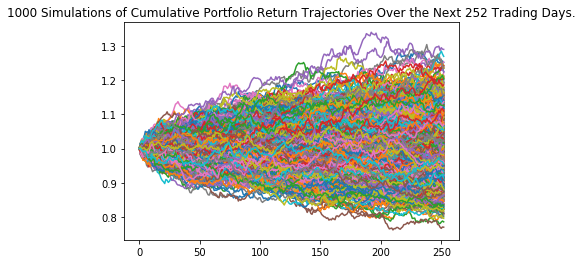

In [28]:
# Plot simulation outcomes
pd.options.plotting.backend = 'matplotlib'
line_plot = forex_montecarlo.plot_simulation()

### Plot the Simulated Daily Returns Trajectory for inputted countries currency over the Next Year (252 Trading Days)

In [29]:
# Compute summary statistics from the simulated daily returns
simulated_returns_data = {
    "mean": list(forex_montecarlo.simulated_return.mean(axis=1)),
    "median": list(forex_montecarlo.simulated_return.median(axis=1)),
    "min": list(forex_montecarlo.simulated_return.min(axis=1)),
    "max": list(forex_montecarlo.simulated_return.max(axis=1))
}

# Create a DataFrame with the summary statistics
df_simulated_returns = pd.DataFrame(simulated_returns_data)

# Display sample data
df_simulated_returns.head()

,mean,median,min,max
0,1.000000,1.000000,1.000000,1.000000
1,1.000430,1.000154,0.980297,1.017284
2,1.000158,0.999884,0.972722,1.027613
3,1.000098,0.999527,0.965331,1.030339
4,0.999898,1.000098,0.965869,1.036443


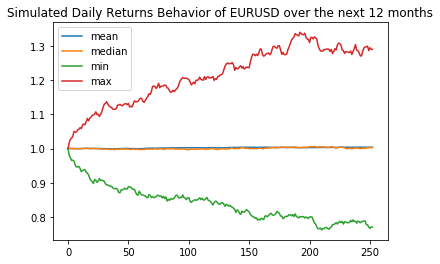

In [30]:
# Use the `plot` function to visually analyze the trajectory of first countries currency returns on a 252 trading day simulation
df_simulated_returns.plot(title=f"Simulated Daily Returns Behavior of {forex_pair} over the next {number_of_months} months");

### Calculate the Simulated Profits/Losses of inputted amount in first countries currency over the Next imputted amount of Trading Days

In [31]:
# Set initial investment
initial_investment = amount

# Multiply an initial investment by the daily returns of simulative stock prices to return the progression of daily returns in terms of money
cumulative_pnl = initial_investment * df_simulated_returns

# Display sample dat
cumulative_pnl.head()

,mean,median,min,max
0,1000.000000,1000.000000,1000.000000,1000.000000
1,1000.429898,1000.153587,980.297494,1017.283969
2,1000.157755,999.884151,972.722113,1027.612506
3,1000.098399,999.527101,965.330838,1030.338779
4,999.898165,1000.097815,965.869072,1036.443250


### Plot the Simulated Profits/Losses of inputted amount in first countries currency Over the Next inputted amount of Trading Days

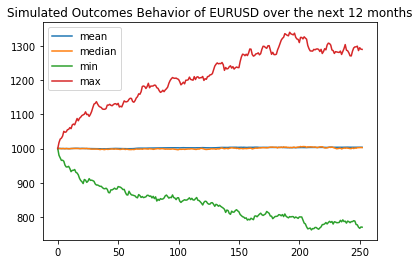

In [32]:
# Use the 'plot' function to create a chart of the simulated profits/losses
cumulative_pnl.plot(title=f"Simulated Outcomes Behavior of {forex_pair} over the next {number_of_months} months");

### Calculate the range of the possible outcomes of our inputted amount in first countries currency

In [33]:
# Fetch summary statistics from the Monte Carlo simulation results
tbl = forex_montecarlo.summarize_cumulative_return()

# Print summary statistics
print(tbl)

count           1000.000000
mean               1.003775
std                0.090938
min                0.769682
25%                0.939698
50%                1.002605
75%                1.062329
max                1.290341
95% CI Lower       0.835678
95% CI Upper       1.193980
Name: 252, dtype: float64


In [34]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our inputted amount in first countries currency
ci_lower = round(tbl[8]*amount,2)
ci_upper = round(tbl[9]*amount,2)

# Print results
print(f"There is a 95% chance that your travel budget of ${amount}"
      f" will end within the range of "
      f" ${ci_lower} and ${ci_upper},"
      f" by the time of your projected vacation.")

There is a 95% chance that your travel budget of $1000 will end within the range of  $835.68 and $1193.98, by the time of your projected vacation.


## Second Countries Currency - Monte Carlo

In [35]:
ticker_data_2 = pd.concat([forex_2], axis=1, keys=[f'{forex_pair_2}'])
number_of_months = number_of_months

# Configure a Monte Carlo simulation to forecast one year daily returns
forex_2_montecarlo = MCSimulation(
    portfolio_data = ticker_data_2,
    num_simulation = 1000,
    num_trading_days = 21 * number_of_months
)

In [36]:
# Run Monte Carlo simulations to forecast one year daily returns
forex_2_montecarlo.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.996711,1.000675,1.001458,0.991114,1.000349,0.997534,1.004332,0.997737,1.004010,1.001681,...,0.999748,0.999087,1.010065,1.011859,0.989173,1.009791,0.997421,0.994152,0.992830,0.998936
2,0.993073,1.000823,0.996644,0.985168,1.001416,0.996296,1.012588,0.998439,1.004075,0.995188,...,1.000660,0.997642,1.009382,1.004028,0.995452,1.017109,0.983991,0.985320,0.988226,0.992530
3,0.996770,0.999418,0.993629,0.986956,0.997105,0.998629,1.015180,0.992873,1.011875,0.991076,...,1.002382,1.002299,1.009427,1.011973,1.002970,1.008083,0.972250,0.975574,0.995054,0.999448
4,1.003025,0.986464,0.991792,0.982666,1.000756,1.008828,1.016302,0.999972,1.014401,0.990483,...,1.011045,0.993903,1.017628,1.013939,0.994246,1.013348,0.978919,0.974419,0.991304,0.993639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,0.903049,0.937281,1.020462,0.968549,1.092362,0.840582,1.091283,0.939474,0.868375,1.075097,...,0.988791,0.964136,0.907578,0.866712,0.917214,1.060014,1.055714,0.968730,0.803499,1.028821
249,0.906145,0.930761,1.019717,0.954576,1.087905,0.841752,1.090413,0.928624,0.867024,1.082315,...,0.993675,0.959484,0.910565,0.863395,0.914227,1.051517,1.062071,0.974944,0.803037,1.029813
250,0.900235,0.928256,1.015438,0.938217,1.104363,0.852800,1.102374,0.934818,0.872662,1.075642,...,1.001160,0.961170,0.913999,0.854565,0.920330,1.046083,1.068965,0.963189,0.803140,1.031278
251,0.890473,0.929170,1.018185,0.934806,1.104181,0.847169,1.094633,0.929617,0.878721,1.071994,...,0.998936,0.964935,0.913167,0.849210,0.930162,1.045402,1.061108,0.948381,0.808650,1.035058


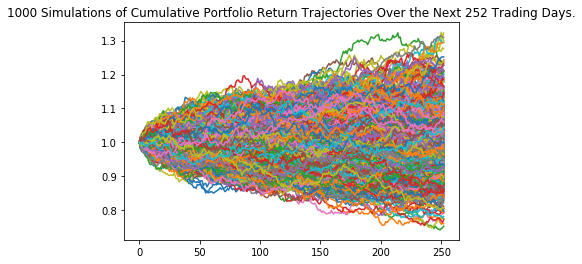

In [37]:
# Plot simulation outcomes
pd.options.plotting.backend = 'matplotlib'
line_plot_2 = forex_2_montecarlo.plot_simulation()

### Plot the Simulated Daily Returns Trajectory for the second countries currency

In [38]:
# Compute summary statistics from the simulated daily returns
simulated_returns_data_2 = {
    "mean": list(forex_2_montecarlo.simulated_return.mean(axis=1)),
    "median": list(forex_2_montecarlo.simulated_return.median(axis=1)),
    "min": list(forex_2_montecarlo.simulated_return.min(axis=1)),
    "max": list(forex_2_montecarlo.simulated_return.max(axis=1))
}

# Create a DataFrame with the summary statistics
df_simulated_returns_2 = pd.DataFrame(simulated_returns_data_2)

# Display sample data
df_simulated_returns_2.head()

,mean,median,min,max
0,1.000000,1.000000,1.000000,1.000000
1,1.000123,1.000013,0.980852,1.017682
2,1.000097,1.000056,0.972116,1.025561
3,1.000264,1.000229,0.971384,1.033772
4,1.000192,0.999959,0.967694,1.037117


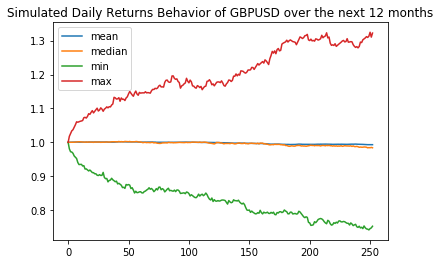

In [39]:
# Use the `plot` function to visually analyze the trajectory of first countries currency returns on a 252 trading day simulation
df_simulated_returns_2.plot(title=f"Simulated Daily Returns Behavior of {forex_pair_2} over the next {number_of_months} months");

### Calculate the Simulated Profits/Losses of inputted amount in first countries currency over the Next imputted amount of Trading Days

In [40]:
# Set initial investment
initial_investment = amount

# Multiply an initial investment by the daily returns of simulative stock prices to return the progression of daily returns in terms of money
cumulative_pnl_2 = initial_investment * df_simulated_returns_2

# Display sample dat
cumulative_pnl_2.head()

,mean,median,min,max
0,1000.000000,1000.000000,1000.000000,1000.000000
1,1000.122946,1000.013268,980.852152,1017.681586
2,1000.096874,1000.056344,972.116066,1025.560980
3,1000.263631,1000.229006,971.383544,1033.772045
4,1000.192260,999.958680,967.693678,1037.116799


### Plot the Simulated Profits/Losses of inputted amount in first countries currency Over the Next inputted amount of Trading Days

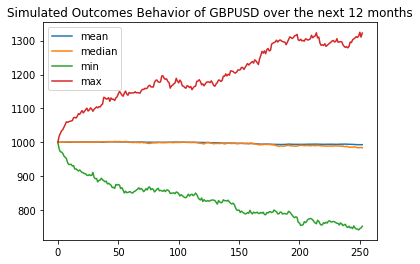

In [41]:
# Use the 'plot' function to create a chart of the simulated profits/losses
cumulative_pnl_2.plot(title=f"Simulated Outcomes Behavior of {forex_pair_2} over the next {number_of_months} months");

In [42]:
# Fetch summary statistics from the Monte Carlo simulation results
tbl_2 = forex_2_montecarlo.summarize_cumulative_return()

# Print summary statistics
print(tbl_2)

count           1000.000000
mean               0.993007
std                0.091052
min                0.752462
25%                0.927970
50%                0.983913
75%                1.051721
max                1.322178
95% CI Lower       0.840893
95% CI Upper       1.190242
Name: 252, dtype: float64


In [43]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our inputted amount in first countries currency
ci_lower_2 = round(tbl_2[8]*amount,2)
ci_upper_2 = round(tbl_2[9]*amount,2)

# Print results
print(f"There is a 95% chance that your travel budget of ${amount}"
      f" will end within the range of "
      f" ${ci_lower_2} and ${ci_upper_2},"
      f" by the time of your projected vacation.")

There is a 95% chance that your travel budget of $1000 will end within the range of  $840.89 and $1190.24, by the time of your projected vacation.


## Third Countries Currency - Monte Carlo

In [44]:
ticker_data_3 = pd.concat([forex_3], axis=1, keys=[f'{forex_pair_3}'])
number_of_months = number_of_months

# Configure a Monte Carlo simulation to forecast one year daily returns
forex_3_montecarlo = MCSimulation(
    portfolio_data = ticker_data_2,
    num_simulation = 1000,
    num_trading_days = 21 * number_of_months
)

In [45]:
# Run Monte Carlo simulations to forecast projected returns
forex_3_montecarlo.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.009371,0.995990,0.987052,0.998018,0.995229,1.012033,0.996902,0.998663,0.995892,1.003628,...,1.009950,1.006368,1.003957,1.001745,1.011589,0.997566,0.995092,0.995675,1.002808,0.993091
2,1.006407,0.980254,0.978625,0.986878,1.005401,1.016485,0.991071,0.995494,0.989529,1.008165,...,1.012919,1.007615,1.007941,0.988843,1.005770,0.998248,1.000853,0.998588,1.009937,0.987704
3,1.002495,0.983726,0.984779,0.982999,1.004872,1.022516,0.995429,0.986465,0.998225,1.003472,...,1.017163,1.005052,1.010421,0.986844,1.001045,0.993748,0.999182,0.995431,1.007136,0.985791
4,1.009267,0.981493,0.972561,0.983315,1.007938,1.014848,0.997725,0.983719,0.982212,1.007175,...,1.003811,1.002284,1.002122,0.982373,1.006881,0.988251,1.004098,1.007555,1.008314,0.986457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.004228,0.917198,1.055078,0.870349,0.935255,0.997707,1.117184,0.992096,0.997461,1.070947,...,1.025986,0.942555,0.882907,0.967494,0.895419,0.925024,1.042197,1.002606,0.947908,0.910030
249,1.004126,0.913049,1.049901,0.865805,0.928492,0.997422,1.117068,0.993434,0.991273,1.062530,...,1.030788,0.951653,0.882918,0.966052,0.899153,0.926146,1.043058,0.993927,0.947096,0.901409
250,1.004773,0.917240,1.053244,0.863725,0.930276,1.003305,1.124286,0.998505,0.995431,1.061119,...,1.032418,0.943733,0.891133,0.967731,0.894475,0.927724,1.026083,0.995982,0.948586,0.899736
251,1.000229,0.924462,1.052265,0.869208,0.934996,1.001910,1.120155,0.991606,0.992091,1.063433,...,1.037330,0.945124,0.898603,0.970661,0.900954,0.930990,1.025757,0.998926,0.954785,0.896938


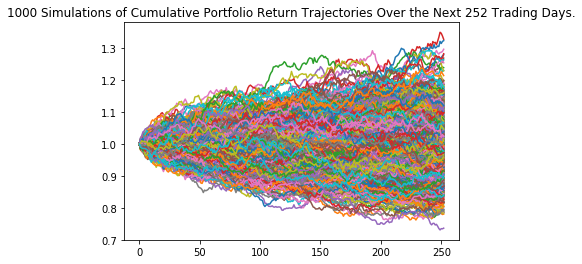

In [46]:
# Plot simulation outcomes
pd.options.plotting.backend = 'matplotlib'
line_plot_3 = forex_3_montecarlo.plot_simulation()

### Plot the Simulated Daily Returns Trajectory for the second countries currency

In [47]:
# Compute summary statistics from the simulated daily returns
simulated_returns_data_3 = {
    "mean": list(forex_3_montecarlo.simulated_return.mean(axis=1)),
    "median": list(forex_3_montecarlo.simulated_return.median(axis=1)),
    "min": list(forex_3_montecarlo.simulated_return.min(axis=1)),
    "max": list(forex_3_montecarlo.simulated_return.max(axis=1))
}

# Create a DataFrame with the summary statistics
df_simulated_returns_3 = pd.DataFrame(simulated_returns_data_3)

# Display sample data
df_simulated_returns_3.head()

,mean,median,min,max
0,1.000000,1.000000,1.000000,1.000000
1,0.999913,1.000086,0.981212,1.020213
2,0.999822,0.999483,0.977007,1.026052
3,1.000051,0.999820,0.972779,1.037861
4,1.000171,1.000527,0.968274,1.040810


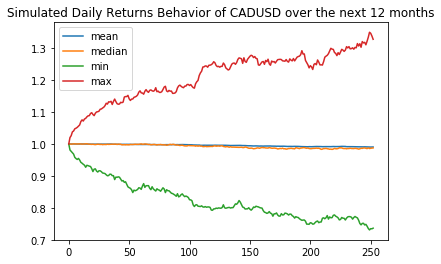

In [48]:
# Use the `plot` function to visually analyze the trajectory of third countries currency returns on a simulation
df_simulated_returns_3.plot(title=f"Simulated Daily Returns Behavior of {forex_pair_3} over the next {number_of_months} months");

### Calculate the Simulated Profits/Losses of inputted amount in first countries currency over the Next imputted amount of Trading Days

In [49]:
# Set initial investment
initial_investment = amount

# Multiply an initial investment by the daily returns of simulative stock prices to return the progression of daily returns in terms of money
cumulative_pnl_3 = initial_investment * df_simulated_returns_3

# Display sample data
cumulative_pnl_3.head()

,mean,median,min,max
0,1000.000000,1000.000000,1000.000000,1000.000000
1,999.912978,1000.086467,981.211856,1020.212595
2,999.822382,999.483327,977.006851,1026.051663
3,1000.050715,999.819685,972.779316,1037.861290
4,1000.170508,1000.527209,968.274214,1040.810283


### Plot the Simulated Profits/Losses of inputted amount in first countries currency Over the Next inputted amount of Trading Days

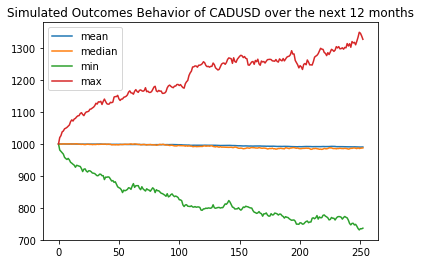

In [50]:
# Use the 'plot' function to create a chart of the simulated profits/losses
cumulative_pnl_3.plot(title=f"Simulated Outcomes Behavior of {forex_pair_3} over the next {number_of_months} months");

In [51]:
# Fetch summary statistics from the Monte Carlo simulation results
tbl_3 = forex_3_montecarlo.summarize_cumulative_return()

# Print summary statistics
print(tbl_3)

count           1000.000000
mean               0.990583
std                0.094309
min                0.736195
25%                0.925718
50%                0.987685
75%                1.048467
max                1.328143
95% CI Lower       0.818295
95% CI Upper       1.179037
Name: 252, dtype: float64


In [52]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our inputted amount in first countries currency
ci_lower_3 = round(tbl_3[8]*amount,2)
ci_upper_3 = round(tbl_3[9]*amount,2)

# Print results
print(f"There is a 95% chance that your travel budget of ${amount}"
      f" will end within the range of "
      f" ${ci_lower_3} and ${ci_upper_3},"
      f" by the time of your projected vacation.")

There is a 95% chance that your travel budget of $1000 will end within the range of  $818.3 and $1179.04, by the time of your projected vacation.


In [53]:
print(f"Comparing all 3 desired countries currencies,"
      f" there is a 95% chance that your travel budget of ${amount}"
      f" will end within the range of: " "\n"
      f" ${ci_lower} and ${ci_upper} for {forex_pair}," "\n"
      f" ${ci_lower_2} and ${ci_upper_2} for {forex_pair_2}," "\n"
      f" ${ci_lower_3} and ${ci_upper_3} for {forex_pair_3}," "\n"
      f" by the time of your projected vacation.")

Comparing all 3 desired countries currencies, there is a 95% chance that your travel budget of $1000 will end within the range of: 
 $835.68 and $1193.98 for EURUSD,
 $840.89 and $1190.24 for GBPUSD,
 $818.3 and $1179.04 for CADUSD,
 by the time of your projected vacation.


# Analyze Risk

## Beta

### Introduce US dollar as benchmark and clean data

In [54]:
# Import US Dollar Index
yahoo_financials = YahooFinancials('DX-Y.NYB')

# Read in US dollar index
read_us_dollar = YahooFinancials('DX-Y.NYB')

# Get US Dollars Historical Price data

# Dict of Dicts 
us_dollar = read_us_dollar.get_historical_price_data('2010-04-23', '2022-04-23', 'daily')

#Parse the data and isolate 'Prices' from the dictionary
us_dollar_price = us_dollar["DX-Y.NYB"]["prices"]

#Create df
us_dollar_df = pd.DataFrame(us_dollar_price)
US_DOLLAR_df = us_dollar_df 
us_dollar_df

,date,high,low,open,close,volume,adjclose,formatted_date
0,1271995200,82.099998,81.320000,82.019997,81.349998,0.0,81.349998,2010-04-23
1,1272168000,NaN,NaN,NaN,NaN,NaN,NaN,2010-04-25
2,1272254400,81.709999,81.169998,81.470001,81.480003,0.0,81.480003,2010-04-26
3,1272340800,82.440002,81.169998,81.180000,82.150002,0.0,82.150002,2010-04-27
4,1272427200,82.709999,82.019997,82.290001,82.379997,0.0,82.379997,2010-04-28
...,...,...,...,...,...,...,...,...
3645,1650254400,100.860001,100.459999,100.500000,100.779999,0.0,100.779999,2022-04-18
3646,1650340800,101.029999,100.699997,100.830002,100.959999,0.0,100.959999,2022-04-19
3647,1650427200,101.040001,100.220001,100.980003,100.389999,0.0,100.389999,2022-04-20
3648,1650513600,100.639999,99.820000,100.349998,100.580002,0.0,100.580002,2022-04-21


In [55]:
# Set the date as the index to the DataFrame
us_dollar_df.set_index(pd.to_datetime(us_dollar_df['formatted_date'], infer_datetime_format=True), inplace=True)

# Drop un needed columns 
us_dollar_df.drop(columns=['date', 'open', 'high', 'low', 'volume', 'adjclose', 'formatted_date'], inplace=True)

# Rename column 
us_dollar_df.columns=['US Dollar Close']

# Count nulls
us_dollar_df.isnull().sum()

# Drop nulls
us_dollar_df = us_dollar_df.dropna()

us_dollar_df.head()

,US Dollar Close
formatted_date,
2010-04-23,81.349998
2010-04-26,81.480003
2010-04-27,82.150002
2010-04-28,82.379997
2010-04-29,82.000000


In [56]:
# Calculate Daily Returns


us_dollar_daily_returns = us_dollar_df.pct_change().dropna()
us_dollar_daily_returns.columns=['US Dollar Daily Returns']
us_dollar_daily_returns

,US Dollar Daily Returns
formatted_date,
2010-04-26,0.001598
2010-04-27,0.008223
2010-04-28,0.002800
2010-04-29,-0.004613
2010-04-30,-0.001585
...,...
2022-04-18,0.004585
2022-04-19,0.001786
2022-04-20,-0.005646


### Calculate Daily Returns

In [57]:
# Calculate Daily Returns four country 1

forex_daily_returns = forex_close.pct_change().dropna()
forex_daily_returns.columns=[f'{forex_pair} Daily Returns']
forex_daily_returns

,EURUSD Daily Returns
2003-02-27,-0.002039
2003-02-28,0.003158
2003-03-03,0.007684
2003-03-04,-0.000827
2003-03-05,0.008920
...,...
2022-04-20,0.005840
2022-04-21,-0.001475
2022-04-22,-0.003784
2022-04-25,-0.007597


In [58]:
# Calculate Daily Returns four country 2

forex_2_daily_returns = forex_2_close.pct_change().dropna()
forex_2_daily_returns.columns=[f'{forex_pair_2} Daily Returns']
forex_2_daily_returns

,GBPUSD Daily Returns
2003-02-27,0.000443
2003-02-28,-0.004304
2003-03-03,0.003178
2003-03-04,0.001647
2003-03-05,0.013537
...,...
2022-04-20,0.004847
2022-04-21,-0.002220
2022-04-22,-0.014963
2022-04-25,-0.007400


In [59]:
# Calculate Daily Returns four country 3

forex_3_daily_returns = forex_3_close.pct_change().dropna()
forex_3_daily_returns.columns=[f'{forex_pair_3} Daily Returns']
forex_3_daily_returns

,CADUSD Daily Returns
2014-11-25,0.002370
2014-11-26,0.000788
2014-11-27,-0.007989
2014-11-28,-0.006919
2014-12-01,0.008795
...,...
2022-04-20,0.009848
2022-04-21,-0.006502
2022-04-22,-0.010697
2022-04-25,-0.001654


In [60]:
joined_forex_daily_returns = pd.concat([forex_daily_returns, forex_2_daily_returns, forex_3_daily_returns], axis='columns', join='inner')

joined_forex_daily_returns

,EURUSD Daily Returns,GBPUSD Daily Returns,CADUSD Daily Returns
2014-11-25,0.002814,0.000255,0.002370
2014-11-26,0.002726,0.005539,0.000788
2014-11-27,-0.003918,-0.004685,-0.007989
2014-11-28,-0.000562,-0.004644,-0.006919
2014-12-01,0.001687,0.005560,0.008795
...,...,...,...
2022-04-20,0.005840,0.004847,0.009848
2022-04-21,-0.001475,-0.002220,-0.006502
2022-04-22,-0.003784,-0.014963,-0.010697
2022-04-25,-0.007597,-0.007400,-0.001654


In [61]:
# Concat Data and rename columns to reflect Daily returns

joined_data = pd.concat([joined_forex_daily_returns, us_dollar_daily_returns], axis='columns', join='inner')
joined_data

,EURUSD Daily Returns,GBPUSD Daily Returns,CADUSD Daily Returns,US Dollar Daily Returns
2014-11-25,0.002814,0.000255,0.002370,-0.002609
2014-11-26,0.002726,0.005539,0.000788,-0.003526
2014-11-28,-0.000562,-0.004644,-0.006919,0.008561
2014-12-01,0.001687,0.005560,0.008795,-0.004640
2014-12-02,-0.007136,-0.006229,-0.007699,0.007959
...,...,...,...,...
2022-04-18,-0.002499,-0.003829,0.000379,0.004585
2022-04-19,0.000928,-0.000769,-0.000883,0.001786
2022-04-20,0.005840,0.004847,0.009848,-0.005646
2022-04-21,-0.001475,-0.002220,-0.006502,0.001893


# Performance Analysis

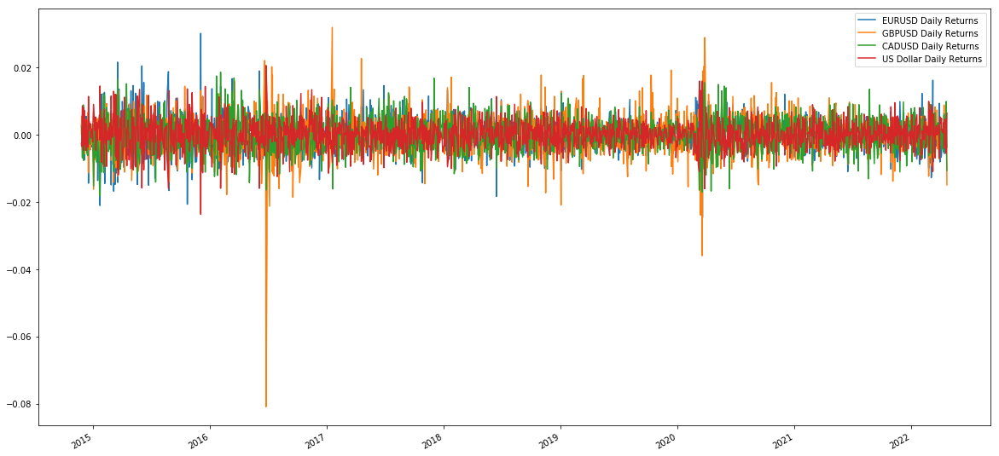

In [62]:
# Plot daily returns of all countries currencies
 
joined_data.plot(figsize=(20,10));

# fix up plot settings

# Calculate and plot cumulative returns

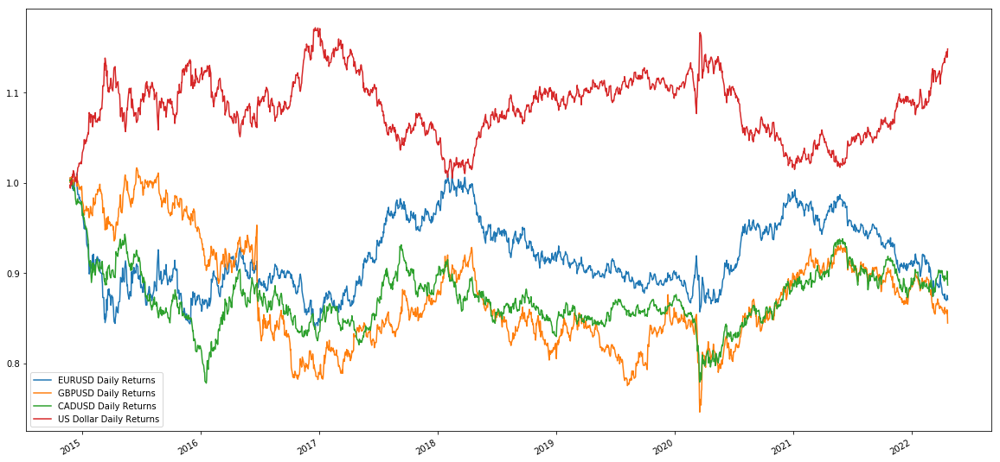

In [63]:
# Calculate cumulative returns of all countries currencies
cum_returns = (1+joined_data).cumprod()

# Plot cumulative returns
cum_returns.plot(figsize=(20,10));

### Create a box plot for each portfolio

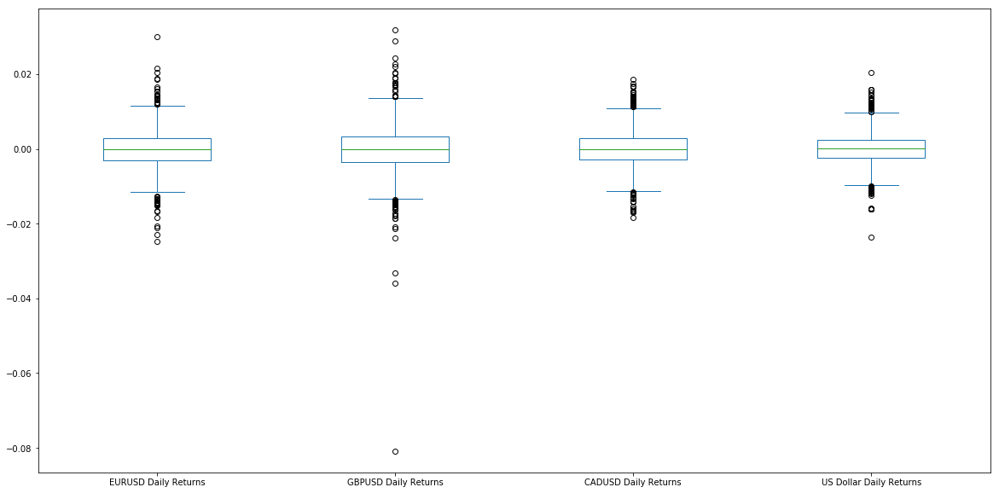

In [64]:
# Box plot to visually show risk

joined_data.plot.box(figsize=(20,10));

### Calculate Standard Deviations

In [65]:
# Calculate the daily standard deviations of all countreis currencies

joined_data_daily_returns_std = joined_data.std()
joined_data_daily_returns_std

EURUSD Daily Returns       0.004920
GBPUSD Daily Returns       0.005970
CADUSD Daily Returns       0.004773
US Dollar Daily Returns    0.004214
dtype: float64

### Determine which country currencies are riskier than the US Dollar Index

In [66]:
# Calculate  the daily standard deviation of US Dollar
isolated_dollar = joined_data['US Dollar Daily Returns'].std()

In [67]:
# Determine which countries currencies are riskier than the US Dollar
joined_data_daily_returns_std > isolated_dollar

EURUSD Daily Returns        True
GBPUSD Daily Returns        True
CADUSD Daily Returns        True
US Dollar Daily Returns    False
dtype: bool

### Calculate the Anualized Standard Deviation

In [68]:
# Calculate the annualized standard deviation (252 trading days)
annualized_std = joined_data_daily_returns_std * np.sqrt(252)
annualized_std

EURUSD Daily Returns       0.078099
GBPUSD Daily Returns       0.094778
CADUSD Daily Returns       0.075770
US Dollar Daily Returns    0.066902
dtype: float64

## Rolling Statistics

Risk changes over time. Analyze the rolling statistics for Risk and Beta. 

1. Calculate and plot the rolling standard deviation for all countries currencies using a 21-day window
2. Calculate the correlation between each countries currency to determine which currencies may mimick the US Dollar
3. Choose one currency, then calculate and plot the 60-day rolling beta between it and the US Dollar

### Calculate and plot rolling std for all portfolios with 21-day window

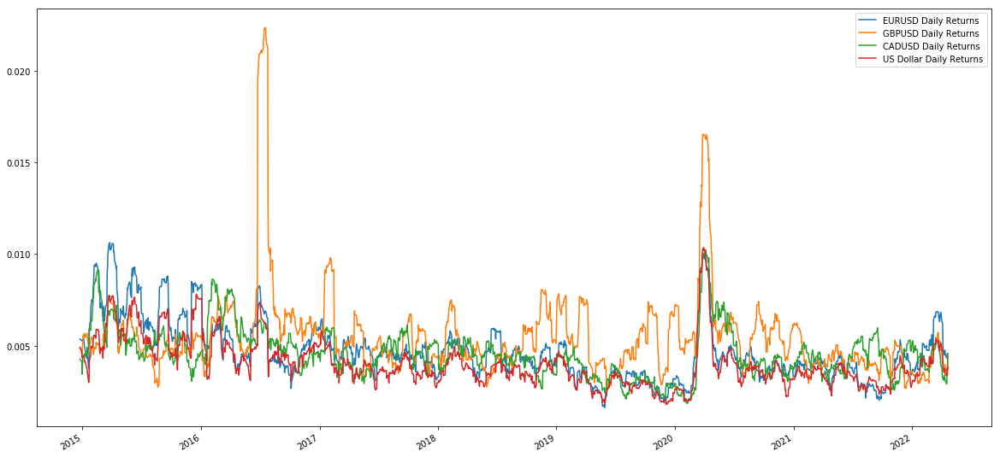

In [69]:
# Calculate the rolling standard deviation for all portfolios using a 21-day window
joined_forex_21_day_std = joined_data.rolling(window = 21).std()

# Plot the rolling standard deviation
joined_forex_21_day_std.plot(figsize=(20, 10));

### Calculate and plot the correlation

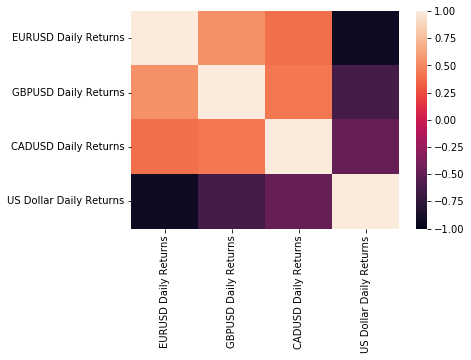

In [70]:
# Calculate the correlation
correlation = joined_data.corr()

# Display de correlation matrix

sns.heatmap(correlation, vmin=-1, vmax=1);

### Calculate and Plot Beta for a chosen countreis currency and the US Dollar

In [71]:
# Chosen Country 1

# Calculate covariance of a single country currency
covariance = (joined_data[f'{forex_pair} Daily Returns'].cov(joined_data['US Dollar Daily Returns']))
covariance

# Calculate variance of S&P 500
variance = joined_data['US Dollar Daily Returns'].var()
variance

# Computing beta
beta = covariance / variance
beta

-1.0706271106632788

In [72]:
# Chosen Country 2

# Calculate covariance of a single country currency
covariance_2 = (joined_data[f'{forex_pair_2} Daily Returns'].cov(joined_data['US Dollar Daily Returns']))
covariance_2

# Calculate variance of S&P 500
variance_2 = joined_data['US Dollar Daily Returns'].var()
variance_2

# Computing beta
beta_2 = covariance_2 / variance_2
beta_2

-0.8976035703639653

In [73]:
# Chosen Country 3

# Calculate covariance of a single country currency
covariance_3 = (joined_data[f'{forex_pair_3} Daily Returns'].cov(joined_data['US Dollar Daily Returns']))
covariance_3

# Calculate variance of S&P 500
variance_3 = joined_data['US Dollar Daily Returns'].var()
variance_3

# Computing beta
beta_3 = covariance / variance
beta_3

-1.0706271106632788

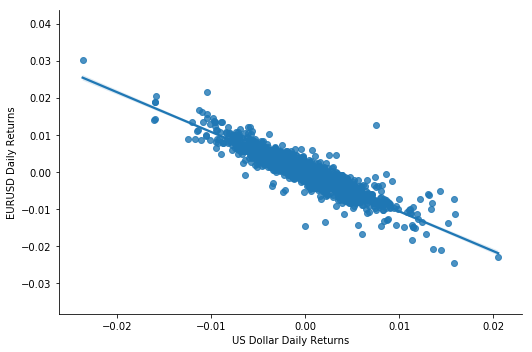

In [74]:
# Plot beta trend for country 1

sns.lmplot(x = "US Dollar Daily Returns", y = f"{forex_pair} Daily Returns", data = joined_data, aspect = 1.5, fit_reg = True);

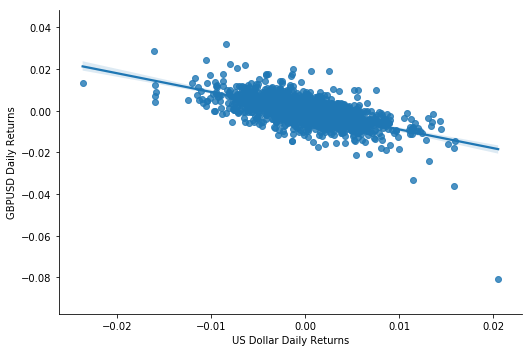

In [75]:
# Plot beta trend for country 2

sns.lmplot(x = "US Dollar Daily Returns", y = f"{forex_pair_2} Daily Returns", data = joined_data, aspect = 1.5, fit_reg = True);

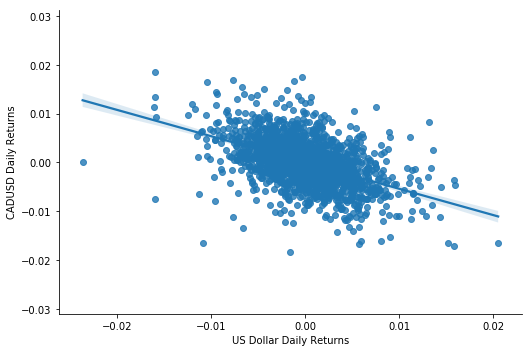

In [76]:
# Plot beta trend for country 3

sns.lmplot(x = "US Dollar Daily Returns", y = f"{forex_pair_3} Daily Returns", data = joined_data, aspect = 1.5, fit_reg = True);

### Using the daily returns, calculate and visualize the Sharpe ratios using a bar plot

In [77]:
# Calculate Annualized Sharpe Ratios
combined_data_sharpe_ratios = (joined_data.mean() * 252) / (joined_data_daily_returns_std * np.sqrt(252))
combined_data_sharpe_ratios


EURUSD Daily Returns      -0.200819
GBPUSD Daily Returns      -0.193604
CADUSD Daily Returns      -0.177093
US Dollar Daily Returns    0.312823
dtype: float64

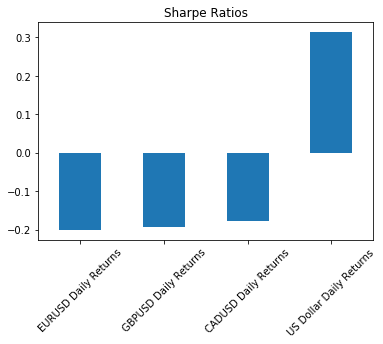

In [79]:
# Visualize the sharpe ratios as a bar plot
combined_data_sharpe_ratios.plot(kind="bar", title= "Sharpe Ratios", rot=45);

# Fix up plot, x axis re size etc..

### Log Returns

In [ ]:
# us_dollar_close = us_dollar_df.rename_axis(index=None)

# joined_close = pd.concat([us_dollar_close, joined_forex])
# joined_close

In [80]:
log_returns = np.log(joined_forex/joined_forex.shift(1)).dropna()
log_returns

daily_std = log_returns.std()

annualized_std = daily_std * np.sqrt(252)

In [81]:
log_returns[f"{forex_pair}"]

,close
2014-11-25,0.002810
2014-11-26,0.002722
2014-11-27,-0.003926
2014-11-28,-0.000562
2014-12-01,0.001685
...,...
2022-04-20,0.005823
2022-04-21,-0.001476
2022-04-22,-0.003791
2022-04-25,-0.007626


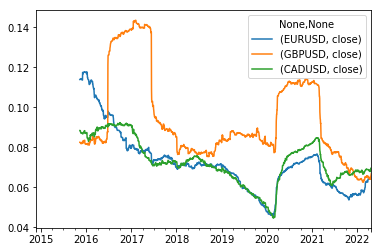

In [82]:
TRADING_DAYS = number_of_months * 21
volatility = log_returns.rolling(window=TRADING_DAYS).std()*np.sqrt(TRADING_DAYS)
volatility.plot();

### Sortino Ratio

The Sortino ratio is very similar to the Sharpe ratio, the only difference being that where the Sharpe ratio uses all the observations for calculating the standard deviation the Sortino ratio only considers the harmful variance

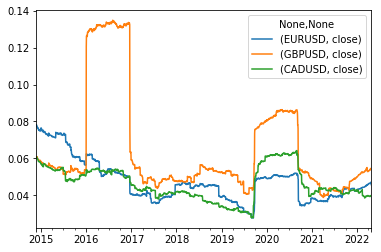

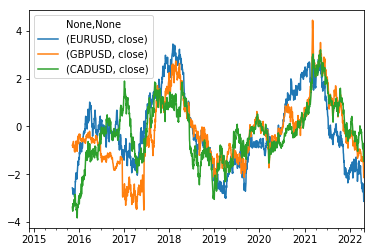

In [83]:
Rf = 0.01/252 #risk-free rate (daily)
sortino_vol = log_returns[log_returns<0].rolling(window=TRADING_DAYS, center=True, min_periods=10).std()*np.sqrt(TRADING_DAYS)
sortino_ratio = (log_returns.rolling(window=TRADING_DAYS).mean() - Rf)*TRADING_DAYS / sortino_vol

sortino_vol.plot();
sortino_ratio.plot();

### Max Drawdown

Max drawdown quantifies the steepest decline from peak to trough observed for an investment. This is useful for a number of reasons, mainly the fact that it doesn't rely on the underlying returns being normally distributed.


In [89]:
def max_drawdown(returns):
    cumulative_returns = (returns+1).cumprod()
    peak = cumulative_returns.expanding(min_periods=1).max()
    drawdown = (cumulative_returns/peak)-1
    return drawdown.min()


returns = joined_forex.pct_change()
max_drawdowns = returns.apply(max_drawdown, axis=0)
max_drawdowns*100

EURUSD  close   -16.953081
GBPUSD  close   -27.997481
CADUSD  close   -22.797344
dtype: float64

### Calmar Ratio

Calmar ratio uses max drawdown in the denominator as opposed to standard deviation.


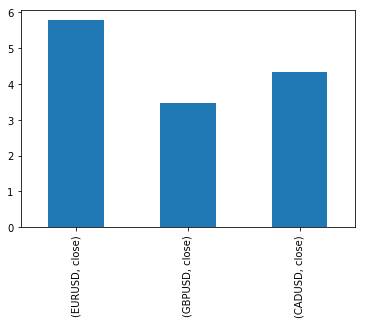

In [90]:
calmars = np.exp(log_returns.mean()*252)/abs(max_drawdowns)
calmars.plot.bar();

### What Countries Currency is the riskiest? 

# Build Map 

In [91]:
# Set Path and Read in csv data.

csvpath = Path("all_countries.csv")
country_list_df = pd.read_csv(csvpath)
#country_list_df

In [ ]:
# Initialize lists to be turned into columns of dataframe
capital_city = []
lat_long = []
currency = []
subregion = []
wiki = []
lat = []
long = []

for country in country_list_df['Country']:
    country_data = CountryInfo(country)
    capital_city.append(country_data.capital())
    lat.append(country_data.capital_latlng()[0])
    long.append(country_data.capital_latlng()[1])
    currency.append(country_data.currencies())
    subregion.append(country_data.subregion())
    wiki.append(country_data.wiki()) 
    
# Build Dataframe

country_list_df['Capital City'] = capital_city
country_list_df['Latitude'] = lat
country_list_df['Longitude'] = long
country_list_df['Currency'] = currency
country_list_df['Sub-Region'] = subregion
country_list_df['wiki'] = wiki
country_list_df

### Plot the populated map

In [ ]:
# Slice and plot data by name
map_1 = px.scatter_mapbox(
    country_list_df,
    lat='Latitude',
    lon='Longitude',
    color="Country",
    zoom=1.2
)
map_1.show()